## Event Detection 

In [1]:
import pandas as pd
import sys
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
sys.path.append('../../')

from scoring.event_detection_matrix import competition_score
from tqdm import tqdm

## Daten laden

In [2]:
predictions = pd.read_parquet('./data/predicted_series.parquet')
validation_events = pd.read_csv('../../data/processed/validation_events_split.csv')

In [3]:
validation_events = validation_events[validation_events.step.notnull()]
validation_events

,series_id,night,event,step,timestamp,num_series_id
0,062dbd4c95e6,1,onset,7872.0,2018-08-22T23:11:00-0400,7
1,062dbd4c95e6,1,wakeup,14484.0,2018-08-23T08:22:00-0400,7
6,062dbd4c95e6,4,onset,60720.0,2018-08-26T00:35:00-0400,7
7,062dbd4c95e6,4,wakeup,68400.0,2018-08-26T11:15:00-0400,7
8,062dbd4c95e6,5,onset,77304.0,2018-08-26T23:37:00-0400,7
...,...,...,...,...,...,...
2955,fcca183903b7,33,wakeup,565824.0,2019-04-28T06:52:00-0400,276
2956,fcca183903b7,34,onset,577344.0,2019-04-28T22:52:00-0400,276
2957,fcca183903b7,34,wakeup,584052.0,2019-04-29T08:11:00-0400,276
2958,fcca183903b7,35,onset,595344.0,2019-04-29T23:52:00-0400,276


In [4]:
predictions['series_id'] = predictions['num_series_id'].astype(str)

In [5]:
predictions['correct_prediction'] = (predictions['awake'] == predictions['prediction_class']).replace({True: 1, False: 0})

## Extract Events

In [6]:
def get_events_smoothed(test_series) :
    series_ids = test_series['num_series_id'].unique()
    events = []

    for idx in tqdm(series_ids):
        # Collecting sample and normalizing features
        X = test_series[test_series.num_series_id == idx]
                
        smoothing_length = 12 * 60 # 30 Minutes
        # We average the confidence, that the participant is awake
        X["confidence_awake"] = X["prediction_confidence_1"].rolling(smoothing_length, center=True).mean().bfill().ffill()
        X["asleep"] = X["prediction_confidence_0"].rolling(smoothing_length, center=True).mean().bfill().ffill()

        # Binarize the asleep column
        X["asleep"] = X["asleep"].round()

        # Getting predicted onset and wakeup time steps
        pred_onsets = X[X['asleep'].diff() > 0]['step'].tolist() # diff is > 0 if it changes from 0 (awake) to 1 (asleep)
        pred_wakeups = X[X['asleep'].diff() < 0]['step'].tolist() # diff is < 0 if it changes from 1 (asleep) to 0 (awake)
     
        if len(pred_onsets) > 0:

            # Ensuring all predicted sleep periods begin and end
            if min(pred_wakeups) < min(pred_onsets):
                pred_wakeups = pred_wakeups[1:]

            if max(pred_onsets) > max(pred_wakeups):
                pred_onsets = pred_onsets[:-1]

            # Keeping sleep periods longer than 30 minutes
            sleep_periods = [(onset, wakeup) for onset, wakeup in zip(pred_onsets, pred_wakeups) if wakeup - onset >= 12 * 30]

            for onset, wakeup in sleep_periods:
                # We take the score
                score = 1 - X[(X['step'] >= onset) & (X['step'] < wakeup)]['confidence_awake'].mean()

                # Adding sleep event to dataframe
                onset_row = {'row_id': len(events), 'series_id': idx, 'step': onset, 'event': 'onset', 'score': score}                
                events.append(onset_row)

                wakeup_row = {'row_id': len(events), 'series_id': idx, 'step': wakeup, 'event': 'wakeup', 'score': score}
                events.append(wakeup_row)

    return pd.DataFrame(events)

In [7]:
predicted_events = get_events_smoothed(predictions)

  0%|                                                                                           | 0/54 [00:00<?, ?it/s]C:\Users\timon\AppData\Local\Temp\ipykernel_9600\2624563889.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["confidence_awake"] = X["prediction_confidence_1"].rolling(smoothing_length, center=True).mean().bfill().ffill()
C:\Users\timon\AppData\Local\Temp\ipykernel_9600\2624563889.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["asleep"] = X["prediction_confidence_0"].rolling(s

 11%|█████████▏                                                                         | 6/54 [00:00<00:04, 10.59it/s]C:\Users\timon\AppData\Local\Temp\ipykernel_9600\2624563889.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["confidence_awake"] = X["prediction_confidence_1"].rolling(smoothing_length, center=True).mean().bfill().ffill()
C:\Users\timon\AppData\Local\Temp\ipykernel_9600\2624563889.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["asleep"] = X["prediction_confidence_0"].rolling(s

C:\Users\timon\AppData\Local\Temp\ipykernel_9600\2624563889.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["asleep"] = X["prediction_confidence_0"].rolling(smoothing_length, center=True).mean().bfill().ffill()
C:\Users\timon\AppData\Local\Temp\ipykernel_9600\2624563889.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["asleep"] = X["asleep"].round()
 24%|███████████████████▋                                                              | 13/54 [00:01<00:04,  8.69it/s]C:\Users\timon\AppData\Local

 35%|████████████████████████████▊                                                     | 19/54 [00:01<00:02, 11.96it/s]C:\Users\timon\AppData\Local\Temp\ipykernel_9600\2624563889.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["confidence_awake"] = X["prediction_confidence_1"].rolling(smoothing_length, center=True).mean().bfill().ffill()
C:\Users\timon\AppData\Local\Temp\ipykernel_9600\2624563889.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["asleep"] = X["prediction_confidence_0"].rolling(s

 46%|█████████████████████████████████████▉                                            | 25/54 [00:02<00:02, 11.32it/s]C:\Users\timon\AppData\Local\Temp\ipykernel_9600\2624563889.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["confidence_awake"] = X["prediction_confidence_1"].rolling(smoothing_length, center=True).mean().bfill().ffill()
C:\Users\timon\AppData\Local\Temp\ipykernel_9600\2624563889.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["asleep"] = X["prediction_confidence_0"].rolling(s

 57%|███████████████████████████████████████████████                                   | 31/54 [00:03<00:02, 10.84it/s]C:\Users\timon\AppData\Local\Temp\ipykernel_9600\2624563889.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["confidence_awake"] = X["prediction_confidence_1"].rolling(smoothing_length, center=True).mean().bfill().ffill()
C:\Users\timon\AppData\Local\Temp\ipykernel_9600\2624563889.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["asleep"] = X["prediction_confidence_0"].rolling(s

 69%|████████████████████████████████████████████████████████▏                         | 37/54 [00:03<00:01, 11.94it/s]C:\Users\timon\AppData\Local\Temp\ipykernel_9600\2624563889.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["confidence_awake"] = X["prediction_confidence_1"].rolling(smoothing_length, center=True).mean().bfill().ffill()
C:\Users\timon\AppData\Local\Temp\ipykernel_9600\2624563889.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["asleep"] = X["prediction_confidence_0"].rolling(s

 80%|█████████████████████████████████████████████████████████████████▎                | 43/54 [00:04<00:00, 11.11it/s]C:\Users\timon\AppData\Local\Temp\ipykernel_9600\2624563889.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["confidence_awake"] = X["prediction_confidence_1"].rolling(smoothing_length, center=True).mean().bfill().ffill()
C:\Users\timon\AppData\Local\Temp\ipykernel_9600\2624563889.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["asleep"] = X["prediction_confidence_0"].rolling(s

 91%|██████████████████████████████████████████████████████████████████████████▍       | 49/54 [00:04<00:00, 13.77it/s]C:\Users\timon\AppData\Local\Temp\ipykernel_9600\2624563889.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["confidence_awake"] = X["prediction_confidence_1"].rolling(smoothing_length, center=True).mean().bfill().ffill()
C:\Users\timon\AppData\Local\Temp\ipykernel_9600\2624563889.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["asleep"] = X["prediction_confidence_0"].rolling(s

In [8]:
validation_events['series_id'] = validation_events['num_series_id']

In [9]:
validation_events

,series_id,night,event,step,timestamp,num_series_id
0,7,1,onset,7872.0,2018-08-22T23:11:00-0400,7
1,7,1,wakeup,14484.0,2018-08-23T08:22:00-0400,7
6,7,4,onset,60720.0,2018-08-26T00:35:00-0400,7
7,7,4,wakeup,68400.0,2018-08-26T11:15:00-0400,7
8,7,5,onset,77304.0,2018-08-26T23:37:00-0400,7
...,...,...,...,...,...,...
2955,276,33,wakeup,565824.0,2019-04-28T06:52:00-0400,276
2956,276,34,onset,577344.0,2019-04-28T22:52:00-0400,276
2957,276,34,wakeup,584052.0,2019-04-29T08:11:00-0400,276
2958,276,35,onset,595344.0,2019-04-29T23:52:00-0400,276


In [10]:
predicted_events

,row_id,series_id,step,event,score
0,0,7,7931,onset,0.742246
1,1,7,14538,wakeup,0.742246
2,2,7,60623,onset,0.790086
3,3,7,66820,wakeup,0.790086
4,4,7,77347,onset,0.766338
...,...,...,...,...,...
2421,2421,276,565836,wakeup,0.812173
2422,2422,276,577411,onset,0.833607
2423,2423,276,583935,wakeup,0.833607
2424,2424,276,595623,onset,0.796348


In [11]:
competition_score(validation_events, predicted_events)

0.4012310850517353

## Daten visualisieren

In [12]:
sample = predictions[predictions.num_series_id == 7]

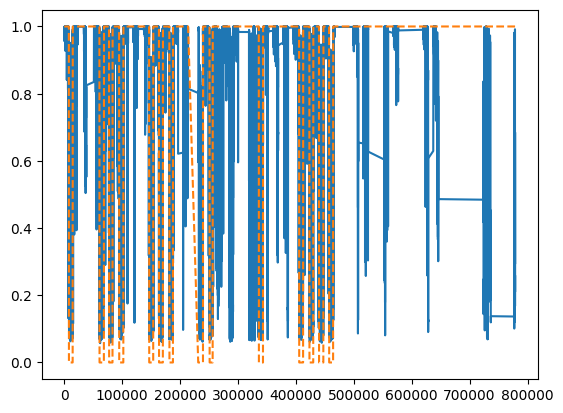

In [13]:
plt.plot(sample['step'], sample['prediction_confidence_1'])
plt.plot(sample['step'], sample['awake'], linestyle='dashed')
plt.show()

## Accuracy pro Serie

In [14]:
series = predictions.series_id.unique()

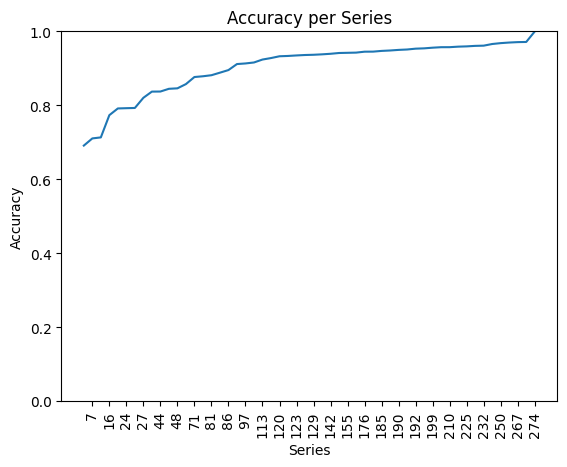

In [15]:
ax = predictions.groupby('series_id')['correct_prediction'].mean().sort_values().plot(
    ylim=(0, 1), title='Accuracy per Series'
)
ax.set_ylabel("Accuracy")
ax.set_xlabel("Series")
ax.set_xticks(ticks=[*range(1, len(series), 2)], labels=series[::2], rotation=90)

fig = ax.get_figure()
fig.savefig("accuracy-per-series.png", bbox_inches="tight")

In [16]:
predictions.groupby('series_id')['correct_prediction'].mean().sort_values()

series_id
187    0.691300
179    0.710709
26     0.713476
71     0.773648
250    0.791793
122    0.792507
171    0.793114
86     0.820632
24     0.837349
27     0.837583
10     0.844945
217    0.846226
83     0.857655
267    0.876830
196    0.878866
44     0.881704
191    0.888610
7      0.895652
210    0.911900
232    0.913552
270    0.916181
120    0.924118
190    0.928129
117    0.932985
113    0.933838
185    0.935215
123    0.936388
192    0.937029
124    0.938198
16     0.939705
176    0.941821
251    0.942345
204    0.942862
81     0.945378
199    0.945533
131    0.947484
48     0.948600
248    0.950223
63     0.951290
72     0.953550
129    0.954404
97     0.956197
155    0.957514
274    0.957575
142    0.958997
276    0.959755
32     0.961090
108    0.961687
148    0.966149
225    0.968531
47     0.970136
228    0.971245
21     0.971685
94     1.000000
Name: correct_prediction, dtype: float64

## Competition Score pro Serie

In [17]:
series_ids = validation_events.series_id.unique()
scores = []

for series_id in tqdm(series_ids):
    predicted_events_series = predicted_events[predicted_events.series_id == series_id]
    true_events_series = validation_events[validation_events.series_id == series_id]

    if len(predicted_events_series) > 0:
        score = competition_score(true_events_series, predicted_events_series)
    else: 
        score = 0
    
    scores.append({'series_id': str(series_id), 'score': score})

scores = pd.DataFrame(scores)

100%|██████████████████████████████████████████████████████████████████████████████████| 54/54 [00:15<00:00,  3.55it/s]


In [18]:
scores = scores.sort_values('score')

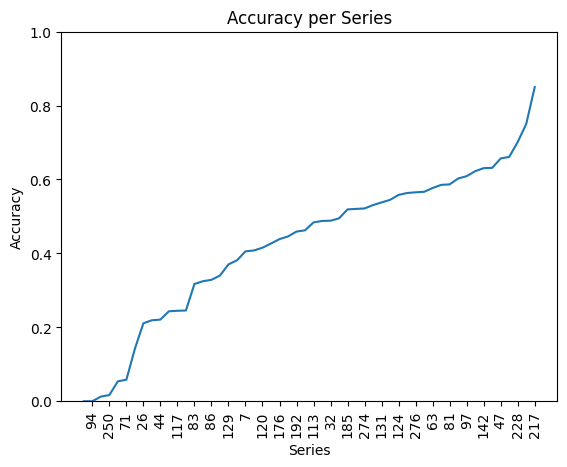

In [19]:
ax = scores.groupby('series_id')['score'].mean().sort_values().plot(
    ylim=(0, 1), title='Accuracy per Series'
)
ax.set_ylabel("Accuracy")
ax.set_xlabel("Series")
ax.set_xticks(ticks=[*range(1, len(scores), 2)], labels=scores.series_id[::2], rotation=90)

fig = ax.get_figure()
fig.savefig("accuracy-per-series.png", bbox_inches="tight")

In [20]:
scores

,series_id,score
17,94,0.000000
39,196,0.000000
48,250,0.012500
35,187,0.016667
12,71,0.053897
50,267,0.058120
5,26,0.141786
31,171,0.210888
8,44,0.219037
23,122,0.220833


## Daten visualisieren

In [21]:
participant_series_id = '228'
participant_series = predictions[predictions.series_id == '228']
participant_series = participant_series[0:100_000]

participant_events = predicted_events[predicted_events.series_id == participant_series_id]
participant_events = participant_events[0:12]

participant_true_events = validation_events[validation_events.series_id == participant_series_id]
participant_true_events = participant_true_events[0:12]

In [22]:
participant_series

,step,num_series_id,awake,prediction_class,prediction_confidence_0,prediction_confidence_1,series_id,correct_prediction
13662964,0,228,1,1,0.000227,0.999773,228,1
13662965,1,228,1,1,0.000209,0.999791,228,1
13662966,2,228,1,1,0.000186,0.999814,228,1
13662967,3,228,1,1,0.000159,0.999841,228,1
13662968,4,228,1,1,0.000144,0.999856,228,1
...,...,...,...,...,...,...,...,...
13762959,99995,228,1,1,0.002426,0.997574,228,1
13762960,99996,228,1,1,0.002713,0.997287,228,1
13762961,99997,228,1,1,0.002989,0.997011,228,1
13762962,99998,228,1,1,0.003330,0.996670,228,1


In [23]:
participant_true_events

,series_id,night,event,step,timestamp,num_series_id


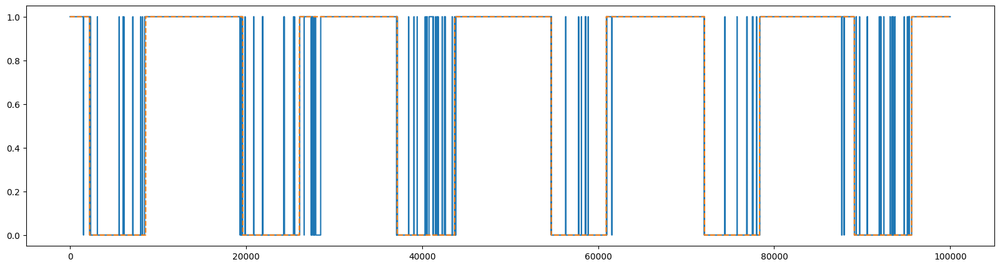

In [24]:
fig, ax = plt.subplots(figsize=(20, 5))
plt.plot(participant_series['step'], participant_series['prediction_class'])
plt.plot(participant_series['step'], participant_series['awake'], linestyle='dashed')
plt.show()

In [25]:
fig = px.line(participant_series, x='step', y='prediction_confidence_1', title=f'Schlafdaten für {participant_series_id}')
for index, row in participant_events.dropna().iterrows():
    color = 'orange' if row.event == 'onset' else 'red' 
    fig.add_vline(x=row.step, line_width=1, line_dash='dash', line_color=color)
    
for index, row in participant_true_events.dropna().iterrows():
    color = 'orange' if row.event == 'onset' else 'red' 
    fig.add_vline(x=row.step, line_width=1, line_color=color)

#Custom Legend
fig.add_trace(
    go.Scatter(
        x=[None],
        y=[None],
        line=dict(color='orange', width=2, dash='dash'),
        name="onset event",
    )
)
fig.add_trace(
    go.Scatter(
        x=[None],
        y=[None],
        line=dict(color='red', width=2, dash='dash'),
        name="wakeup event",
    )
)
fig.update_layout(legend_title="Events")
    
fig.show()